# pySCENIC protocol: PBMC10k downstream analyses

August 2019

Dataset: *10k PBMCs from a Healthy Donor* available from 10x Genomics ([here](https://support.10xgenomics.com/single-cell-gene-expression/datasets/3.0.0/pbmc_10k_v3)).

This notebook uses a loom file generated from the first part of the SCENIC protocol, described in: [PBMC10k_SCENIC-protocol-CLI.ipynb](https://github.com/aertslab/SCENICprotocol/blob/master/notebooks/PBMC10k_SCENIC-protocol-CLI.ipynb)

In [1]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

/usr/local/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/usr/local/lib/python3.7/site-packages/louvain/Optimiser.py:349: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(issubclass(partition_type, LinearResolutionParameterVertexPartition),


#### set variables for file paths to read from and write to:

In [2]:
# set a working directory
wdir = "/mnt/beegfs/data/users/vsc32528/pbmc10kprotocol/"
wdir = '/ddn1/vol1/staging/leuven/stg_00002/lcb/cflerin/testruns/scenic-protocol/prottest4'
os.chdir( wdir )


# path to loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'PBMC10k.loom'

In [3]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.4.4 anndata==0.6.22 umap==0.3.9 numpy==1.16.2 scipy==1.3.0 pandas==0.23.4 scikit-learn==0.21.2 statsmodels==0.10.0 python-igraph==0.7.1 louvain==0.6.1


## Extract relevant data from the integrated loom file

In [4]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [5]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [6]:
# cell annotations from the loom column attributes:
cellAnnot = pd.concat(
    [
        pd.DataFrame( lf.ca.Celltype_Garnett, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Louvain_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
 'Celltype_Garnett',
 'ClusterID',
 'Louvain_clusters_Scanpy',
 'Percent_mito',
 'nGene',
 'nUMI']

In [7]:
# capture embeddings:
dr = [
    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [8]:
lf.close()

### Alternately, we can load this data into a `scanpy.AnnData` object

This can be done directly from the integrated loom file, with a few modifications to allow for SCENIC- and SCope-specific loom attributes:

In [9]:
adata = sc.read( f_final_loom, validate=False)

# drop the embeddings and extra attributes from the obs object
adata.obs.drop( ['Embedding','Embeddings_X','Embeddings_Y','RegulonsAUC'], axis=1, inplace=True )

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [10]:
# add the embeddings into the adata.obsm object
for i,x in enumerate( dr ):
    adata.obsm[ 'X_'+dr_names[i] ] = x.as_matrix()

/usr/local/bin/ipython:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import re


In [11]:
sc.utils.sanitize_anndata( adata )

... storing 'Celltype_Garnett' as categorical
... storing 'ClusterID' as categorical
... storing 'Clusterings' as categorical
... storing 'Louvain_clusters_Scanpy' as categorical
... storing 'Regulons' as categorical


#### We can also add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [ ]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('reg.csv')
add_scenic_metadata(adata, auc_mtx, sig)

---
## Display a motifs table with motif logos

#### View the motifs table along with motif logos

In [12]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [13]:
df_motifs = load_motifs('reg.csv')

In [14]:
selected_motifs = ['PAX5','TCF3','EBF1']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [15]:
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

---
# Dimensionality reduction plots

### Show both highly variable genes and SCENIC UMAP plots with Louvain clustering and cell type classifications

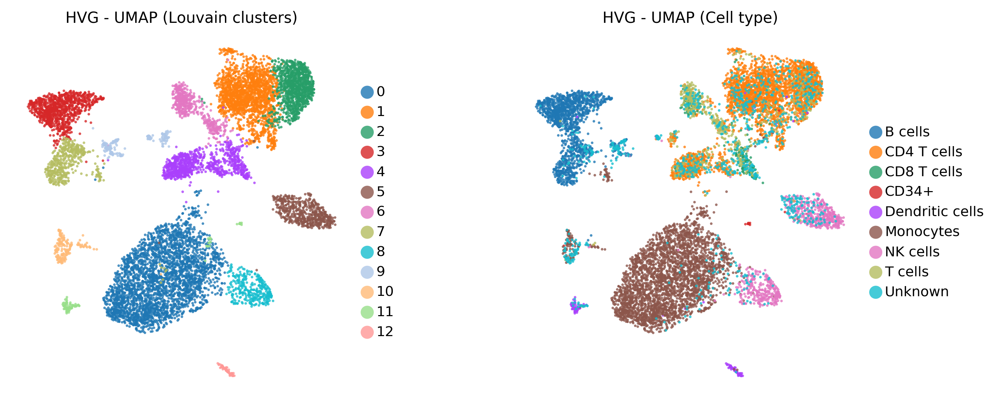

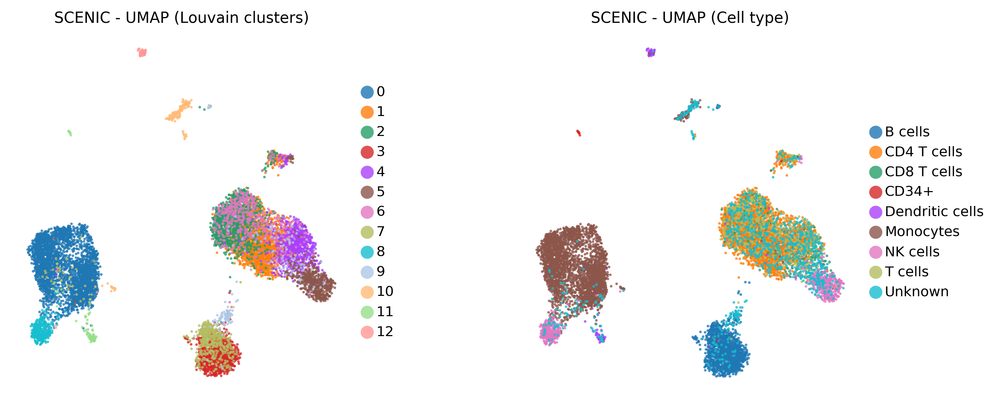

In [16]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=10)

sc.pl.scatter( adata, basis='highly_variable_genes_UMAP', 
    color=['Louvain_clusters_Scanpy','Celltype_Garnett'],
    title=['HVG - UMAP (Louvain clusters)','HVG - UMAP (Cell type)'],
    alpha=0.8,
    save='_Louvain-celltype.svg'
    )

sc.pl.scatter( adata, basis='SCENIC_AUC_UMAP', 
    color=['Louvain_clusters_Scanpy','Celltype_Garnett'],
    title=['SCENIC - UMAP (Louvain clusters)','SCENIC - UMAP (Cell type)'], 
    alpha=0.8,
    save='_Louvain-celltype.svg'
    )

### Alternately, we can plot two dimensionality reductions side-by-side

(this uses non-Scanpy plotting functions)

In [17]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


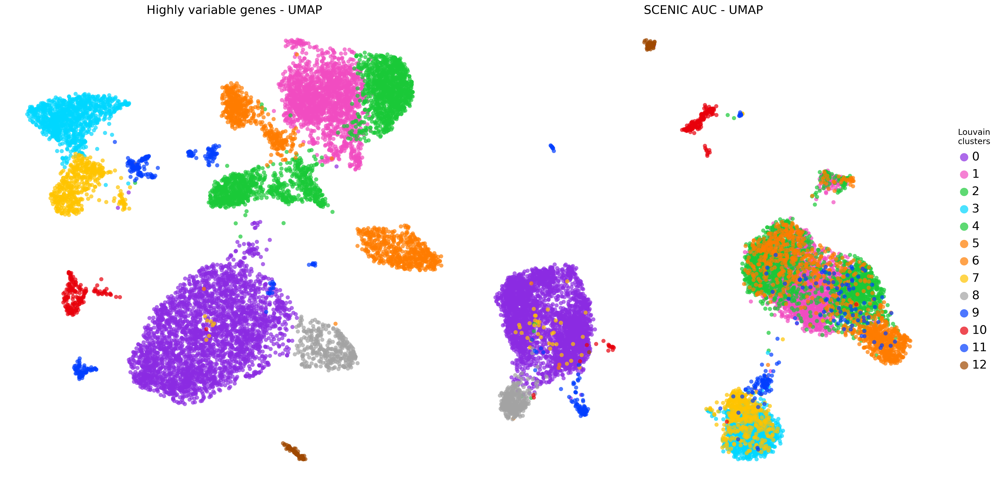

In [18]:
plt.rcParams.update({'font.size':12})

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10), dpi=150 )

drplot( dr[0], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr[4], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax2, palette='bright', s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

plt.tight_layout()
plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.png", dpi=150, bbox_inches = "tight")

---
# Regulon specificity scores (RSS) across predicted cell types

In [19]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

### Calculate RSS

In [20]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['Celltype_Garnett'] )
rss_cellType

,AHR_(+),AIRE_(+),AR_(+),ARID3A_(+),ARNT_(+),ARNTL2_(+),ASCL2_(+),ATF1_(+),ATF3_(+),ATF4_(+),...,ZNF721_(+),ZNF76_(+),ZNF768_(+),ZNF81_(+),ZNF831_(+),ZNF836_(+),ZNF891_(+),ZNF91_(+),ZSCAN2_(+),ZSCAN31_(+)
CD4 T cells,0.204242,0.152615,0.099615,0.211804,0.221045,0.222868,0.105423,0.249236,0.210817,0.241452,...,0.221239,0.248476,0.233607,0.227680,0.289350,0.101234,0.173118,0.265917,0.177434,0.134317
Monocytes,0.296042,0.089694,0.098790,0.255288,0.241136,0.190429,0.090350,0.210069,0.286762,0.221292,...,0.141772,0.191071,0.225460,0.132550,0.128852,0.092351,0.118511,0.172170,0.145892,0.112202
NK cells,0.124209,0.094151,0.096543,0.133131,0.128043,0.133506,0.249981,0.133357,0.129551,0.125818,...,0.110162,0.133762,0.130244,0.112112,0.119575,0.186877,0.105028,0.125217,0.114737,0.106479
B cells,0.155202,0.096163,0.095407,0.175223,0.156688,0.186734,0.096683,0.168010,0.151176,0.167310,...,0.238475,0.177674,0.169940,0.207939,0.161257,0.088904,0.199137,0.177228,0.188386,0.155258
Unknown,0.136787,0.114478,0.097101,0.141248,0.140634,0.147177,0.123459,0.148352,0.139499,0.147511,...,0.140589,0.149078,0.145066,0.144052,0.153243,0.108210,0.125448,0.150179,0.135003,0.115179
T cells,0.120030,0.112539,0.092035,0.122861,0.124499,0.125180,0.104633,0.133137,0.121931,0.129627,...,0.129196,0.132478,0.128089,0.130421,0.142882,0.096237,0.120681,0.137436,0.120976,0.110410
Dendritic cells,0.098905,0.088289,0.203762,0.102523,0.096126,0.101105,0.092202,0.098086,0.098078,0.101095,...,0.094687,0.097372,0.096869,0.095417,0.091828,0.096122,0.090608,0.097803,0.092983,0.098308
CD8 T cells,0.100734,0.107934,0.091640,0.103483,0.103736,0.105779,0.107211,0.107894,0.102110,0.105060,...,0.102256,0.107064,0.104485,0.103309,0.110702,0.094796,0.103230,0.108549,0.100998,0.102540
CD34+,0.089551,0.089142,0.090452,0.089720,0.089868,0.089888,0.088684,0.089863,0.089417,0.090341,...,0.090359,0.089688,0.089045,0.089864,0.088837,0.092447,0.088569,0.089873,0.089126,0.088241


### RSS panel plot with all cell types

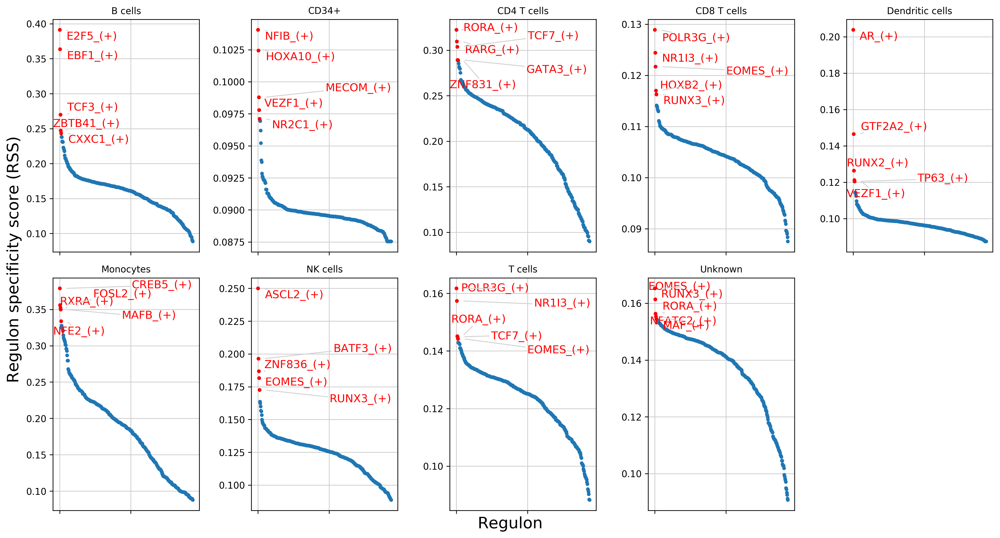

In [21]:
cats = sorted(list(set(cellAnnot['Celltype_Garnett'])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        #'axes.labelsize': 'x-large',
        #'axes.titlesize':'x-large',
        'xtick.labelsize':'large',
        'ytick.labelsize':'large'
        })
plt.savefig("PBMC10k_cellType-RSS-top5.png", dpi=150, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each cell type

In [22]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

#### Generate a Z-score for each regulon to enable comparison between regulons

In [23]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

#### Generate a heatmap

In [24]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [25]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot['Celltype_Garnett'] ]

/usr/local/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


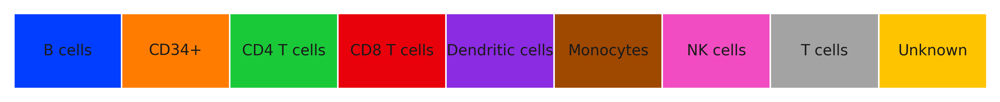

In [26]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)

Text(0.5, 313.60937500000006, '')

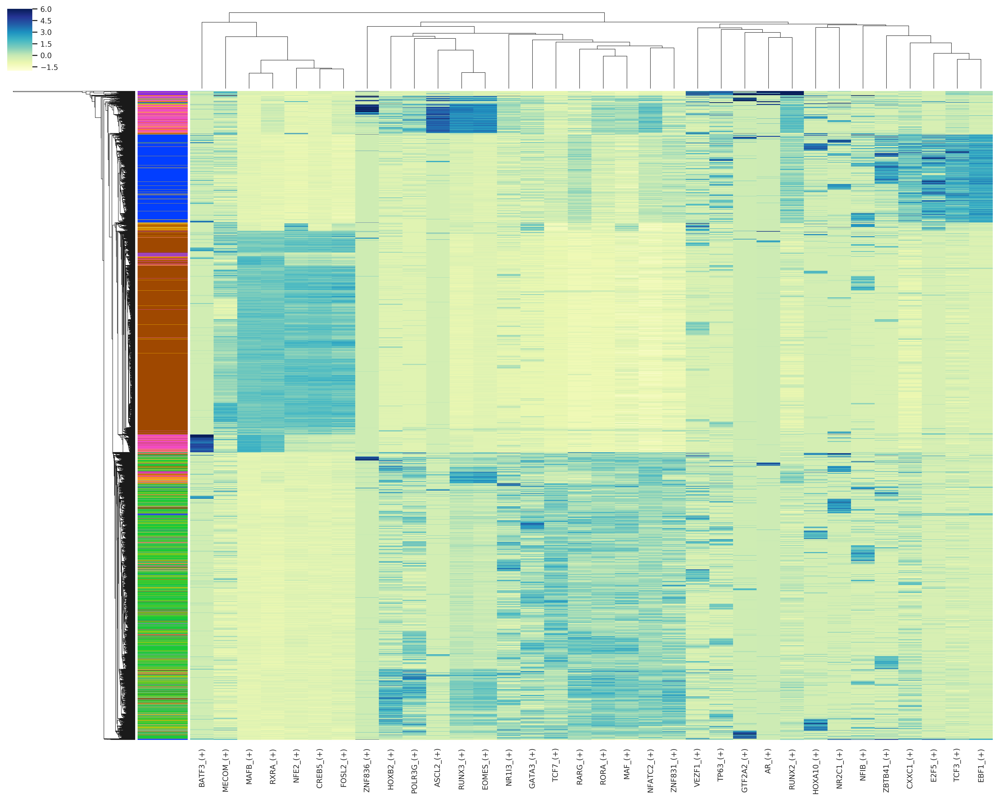

In [27]:
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
sns.set(font_scale=0.9)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')    
g.ax_heatmap.set_xlabel('')    

### Generate a binary regulon activity matrix:

In [28]:
binary_mtx, auc_thresholds = binarize( auc_mtx, num_workers=25 )
binary_mtx.head()

,AHR_(+),AIRE_(+),AR_(+),ARID3A_(+),ARNT_(+),ARNTL2_(+),ASCL2_(+),ATF1_(+),ATF3_(+),ATF4_(+),...,ZNF721_(+),ZNF76_(+),ZNF768_(+),ZNF81_(+),ZNF831_(+),ZNF836_(+),ZNF891_(+),ZNF91_(+),ZSCAN2_(+),ZSCAN31_(+)
AAACCCAAGCGCCCAT-1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,1,0,0,1,0
AAACCCACAGAGTTGG-1,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
AAACCCACAGGTATGG-1,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,1,0
AAACCCACATAGTCAC-1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,0,0
AAACCCACATCCAATG-1,0,0,0,0,0,1,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


### Show the AUC distributions for selected regulons

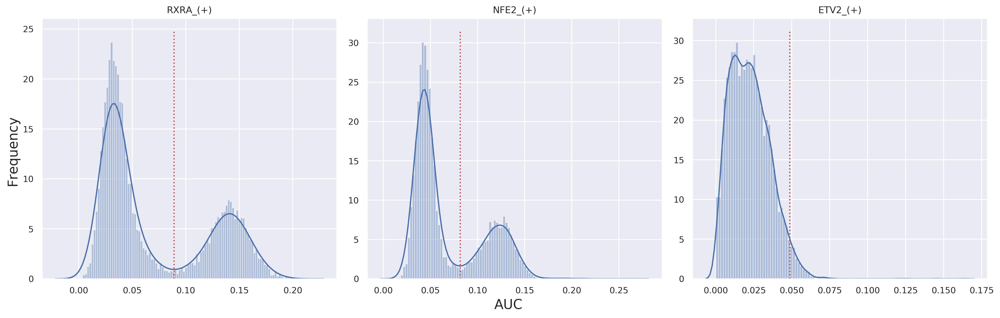

In [29]:
# select regulons:
r = [ 'RXRA_(+)', 'NFE2_(+)', 'ETV2_(+)' ]

fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')
    
fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')
fig.text(0.5, 0.0, 'AUC', ha='center', va='center', rotation='horizontal', size='x-large')

fig.tight_layout()
fig.savefig("PBMC10k_cellType-binaryPlot2.png", dpi=150, bbox_inches = "tight")

---
# Regulon specificity scores (RSS) across Louvain clusters

### Calculate RSS

In [30]:
rss_louvain = regulon_specificity_scores( auc_mtx, cellAnnot['Louvain_clusters_Scanpy'] )
rss_louvain

,AHR_(+),AIRE_(+),AR_(+),ARID3A_(+),ARNT_(+),ARNTL2_(+),ASCL2_(+),ATF1_(+),ATF3_(+),ATF4_(+),...,ZNF721_(+),ZNF76_(+),ZNF768_(+),ZNF81_(+),ZNF831_(+),ZNF836_(+),ZNF891_(+),ZNF91_(+),ZSCAN2_(+),ZSCAN31_(+)
1,0.167702,0.134831,0.095345,0.173243,0.176672,0.195214,0.097510,0.194730,0.172422,0.194693,...,0.177667,0.194938,0.185232,0.187188,0.219024,0.096556,0.147181,0.208766,0.153351,0.114661
0,0.292369,0.089581,0.097183,0.250708,0.237876,0.184571,0.089788,0.207092,0.283414,0.215001,...,0.138432,0.187750,0.222504,0.128491,0.128016,0.092592,0.117640,0.169678,0.141016,0.112218
5,0.111614,0.098285,0.100686,0.122678,0.121547,0.130460,0.341674,0.128484,0.118155,0.119877,...,0.109921,0.124783,0.124808,0.111611,0.125934,0.224524,0.105148,0.122637,0.109547,0.116081
3,0.137639,0.095607,0.092931,0.151788,0.140833,0.156044,0.095075,0.147224,0.134775,0.144525,...,0.205381,0.155351,0.149708,0.182861,0.144645,0.087556,0.171538,0.154047,0.168770,0.150732
6,0.115832,0.121216,0.092222,0.116701,0.120063,0.116751,0.096055,0.126219,0.116109,0.123462,...,0.127958,0.125634,0.122616,0.126901,0.132314,0.092214,0.121138,0.132062,0.115368,0.105001
2,0.140861,0.129850,0.093529,0.142128,0.152024,0.137654,0.094960,0.162442,0.141404,0.153925,...,0.163973,0.161723,0.153721,0.166659,0.165640,0.093351,0.148424,0.172063,0.141981,0.126021
12,0.092917,0.088426,0.263248,0.098344,0.091275,0.097211,0.092761,0.093484,0.092625,0.096707,...,0.091698,0.093541,0.092428,0.092529,0.088917,0.093548,0.088402,0.094451,0.089971,0.098086
4,0.129154,0.127483,0.100345,0.137555,0.136332,0.140719,0.125742,0.148760,0.135886,0.143357,...,0.124077,0.148570,0.144278,0.126211,0.179422,0.112686,0.114744,0.145467,0.123312,0.122828
8,0.113363,0.088039,0.088830,0.113181,0.107979,0.105703,0.088072,0.107905,0.113810,0.106729,...,0.095707,0.111864,0.107316,0.097530,0.094628,0.087556,0.093769,0.102857,0.104078,0.089097
10,0.100682,0.089472,0.105055,0.101714,0.100684,0.106963,0.087869,0.098252,0.100026,0.109152,...,0.098801,0.101056,0.098890,0.102499,0.090766,0.088448,0.094808,0.096277,0.114418,0.087884


### RSS panel plot with all cell types

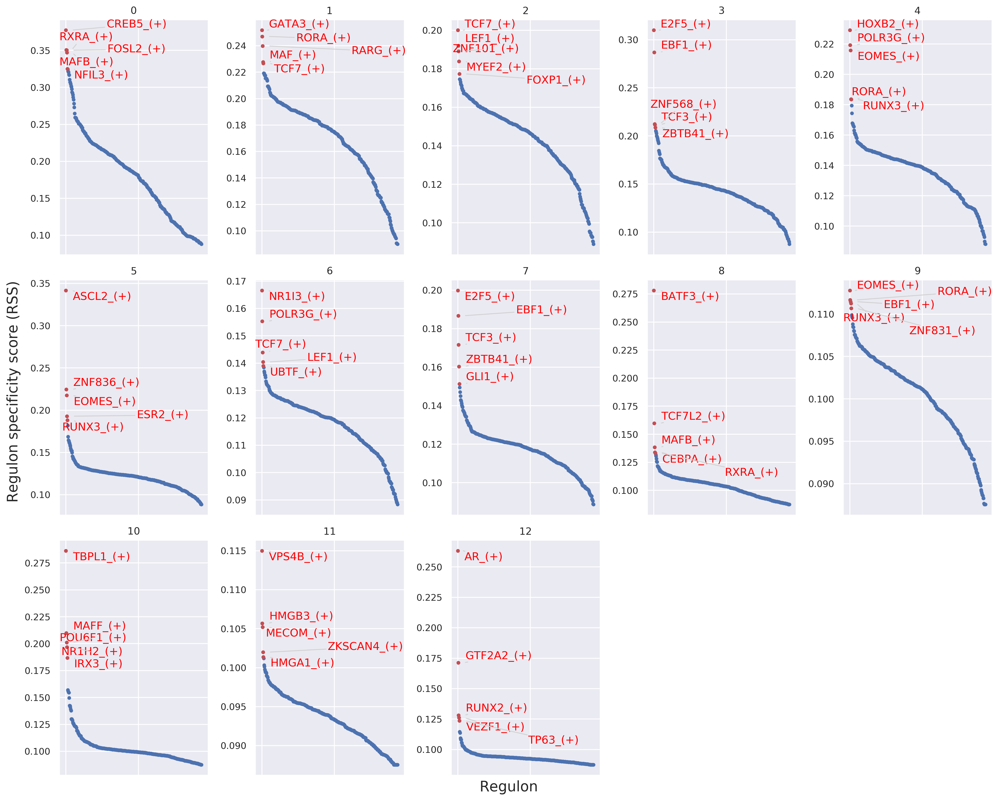

In [32]:
cats = sorted( list(set(cellAnnot['Louvain_clusters_Scanpy'])), key=int )

fig = plt.figure(figsize=(15, 12))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_louvain.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_louvain, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'xtick.labelsize':'large',
        'ytick.labelsize':'large'
        })
plt.savefig("PBMC10k_Louvain-RSS-top5.png", dpi=150, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each cell type

In [33]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_louvain.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

#### Generate a heatmap

In [34]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [36]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot['Louvain_clusters_Scanpy'] ]

/usr/local/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


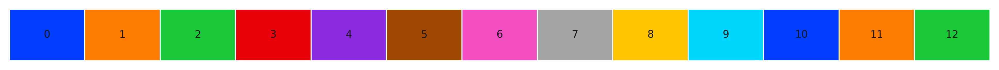

In [37]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)

Text(0.5, 313.60937500000006, '')

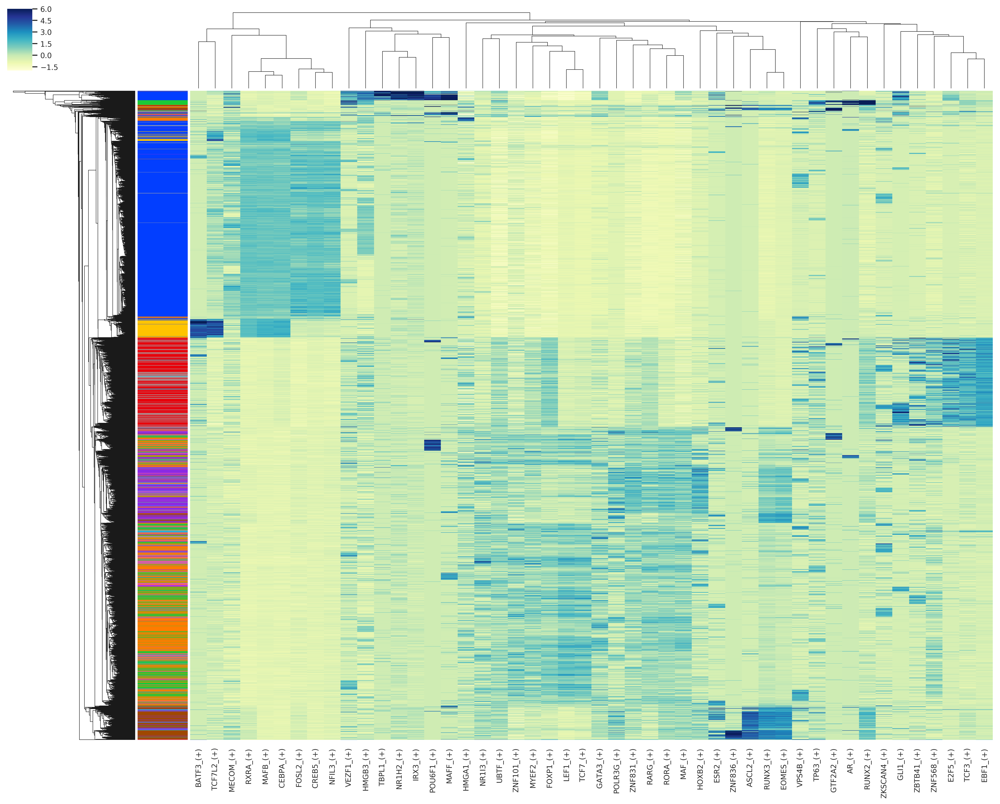

In [38]:
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
sns.set(font_scale=0.9)
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')    
g.ax_heatmap.set_xlabel('')    

# Further exploration of modules directly from the network inference output

In [39]:
adjacencies = pd.read_csv("adj.tsv", index_col=False, sep='\t')

Create the modules:

In [40]:
from pyscenic.utils import modules_from_adjacencies
modules = list(modules_from_adjacencies(adjacencies, exprMat))

/usr/local/lib/python3.7/site-packages/pyscenic/utils.py:138: RuntimeWarning: invalid value encountered in greater
  regulations = (rhos > rho_threshold).astype(int) - (rhos < -rho_threshold).astype(int)
/usr/local/lib/python3.7/site-packages/pyscenic/utils.py:138: RuntimeWarning: invalid value encountered in less
  regulations = (rhos > rho_threshold).astype(int) - (rhos < -rho_threshold).astype(int)


#### pick out modules for EBF1:

In [41]:
tf = 'EBF1'
tf_mods = [ x for x in modules if x.transcription_factor==tf ]

for i,mod in enumerate( tf_mods ):
    print( f'{tf} module {str(i)}: {len(mod.genes)} genes' )
print( f'{tf} regulon: {len(regulons[tf+"_(+)"])} genes' )

EBF1 module 0: 548 genes
EBF1 module 1: 303 genes
EBF1 module 2: 51 genes
EBF1 module 3: 85 genes
EBF1 module 4: 166 genes
EBF1 module 5: 478 genes
EBF1 regulon: 81 genes


write these modules, and the regulon to files:

In [42]:
for i,mod in enumerate( tf_mods ):
    with open( tf+'_module_'+str(i)+'.txt', 'w') as f:
        for item in mod.genes:
            f.write("%s\n" % item)
            
with open( tf+'_regulon.txt', 'w') as f:
    for item in regulons[tf+'_(+)']:
        f.write("%s\n" % item)

### These module files can be further explored in **[iRegulon](http://iregulon.aertslab.org/).**

A detailed iRegulon tutorial is available [here](http://iregulon.aertslab.org/tutorial.html)

This can produce, for example, the following image:

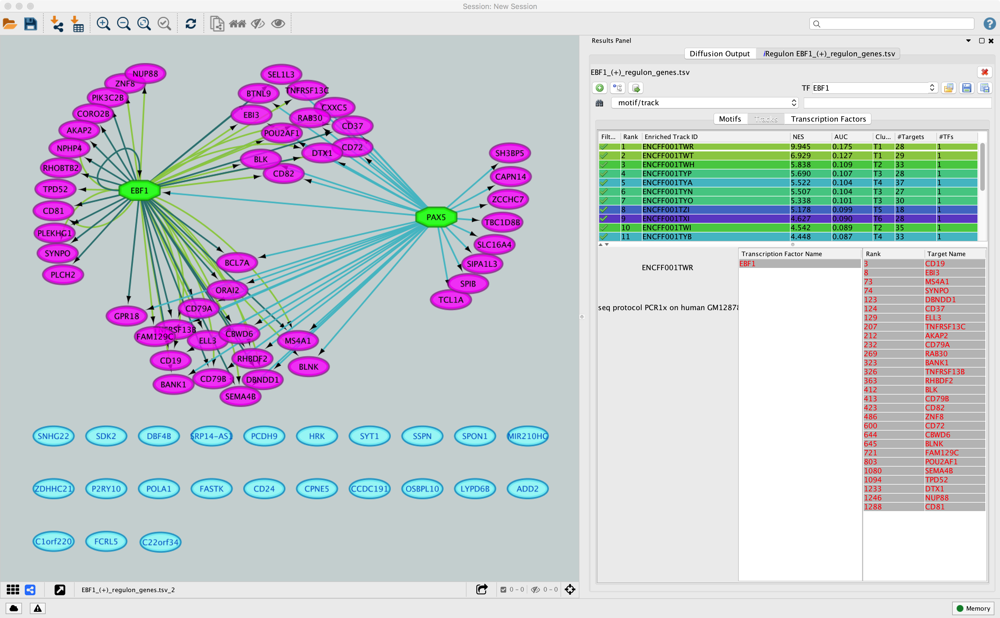

In [43]:
from IPython.display import display, Image
display(Image(filename='iRegulon_screenshot_PBMC10k-EBF1.png'))